<a href="https://colab.research.google.com/github/YYC-CHUAN/dip-CTuse/blob/main/Denoising.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


**Code for "Blind restoration of a JPEG-compressed image" and "Blind image denoising" figures.**



In [1]:
!git clone https://github.com/YYC-CHUAN/dip-CTuse.git
!mv dip-CTuse/* ./

Cloning into 'dip-CTuse'...
remote: Enumerating objects: 452, done.
remote: Counting objects: 100% (137/137), done.
remote: Compressing objects: 100% (130/130), done.
remote: Total 452 (delta 80), reused 7 (delta 7), pack-reused 315 (from 2)
Receiving objects: 100% (452/452), 62.51 MiB | 9.26 MiB/s, done.
Resolving deltas: 100% (167/167), done.


# Import libs

In [2]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline
0
import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'


import numpy as np
from models import *

import torch
import torch.optim


from skimage.metrics import peak_signal_noise_ratio as compare_psnr
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

In [3]:
import skimage.measure

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
fname = 'data-new/Denoising/Compression artifact/8kb.png'

# Load image

512


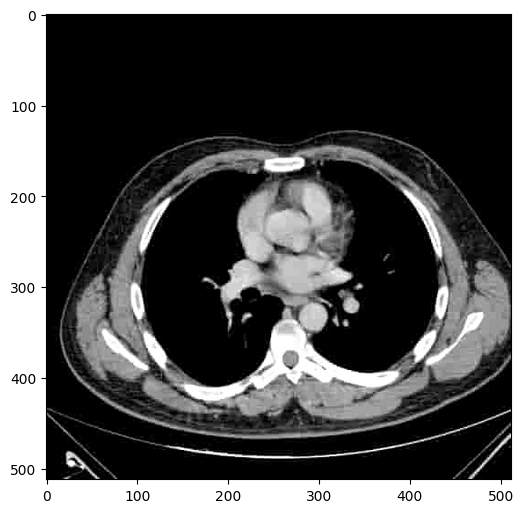

In [6]:
# if fname == 'data/denoising/F16_GT.png':
if fname == 'data-new/Denoising/Compression artifact/8kb.png':
    img_noisy_pil = crop_image(get_image(fname, imsize)[0], d=32)
    img_noisy_np = pil_to_np(img_noisy_pil)

    # As we don't have ground truth
    img_pil = img_noisy_pil
    img_np = img_noisy_np

    channels = img_np.shape[-1]
    print(channels)

    if PLOT:
        plot_image_grid([img_np], 4, 5);

else:
    assert False

# Setup

In [7]:
INPUT = 'noise'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER= 'LBFGS'  # 'adam'
OPTIMIZER= 'adam'  # 'LBFGS'
show_every = 100
exp_weight=0.99

if fname == 'data-new/Denoising/Compression artifact/8kb.png':
    num_iter = 3000
    input_depth = 32
    figsize = 4


    net = get_net(input_depth, 'skip', pad,
                  skip_n33d=128,
                  skip_n33u=128,
                  skip_n11=4,
                  num_scales=5 ,
                  upsample_mode='bilinear').type(dtype)

else:
    assert False




net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]);
print ('Number of params: %d' % s)

mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 2217831


# Optimize

Starting optimization with ADAM


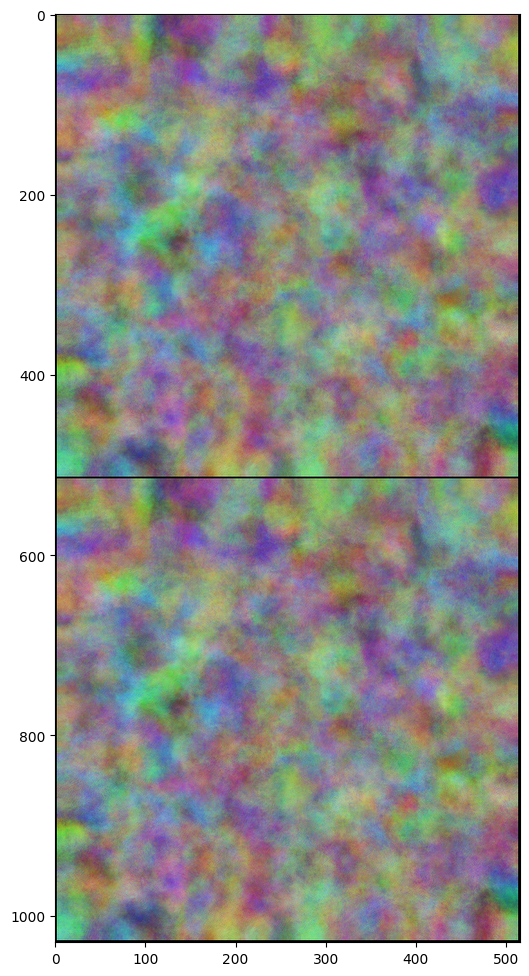

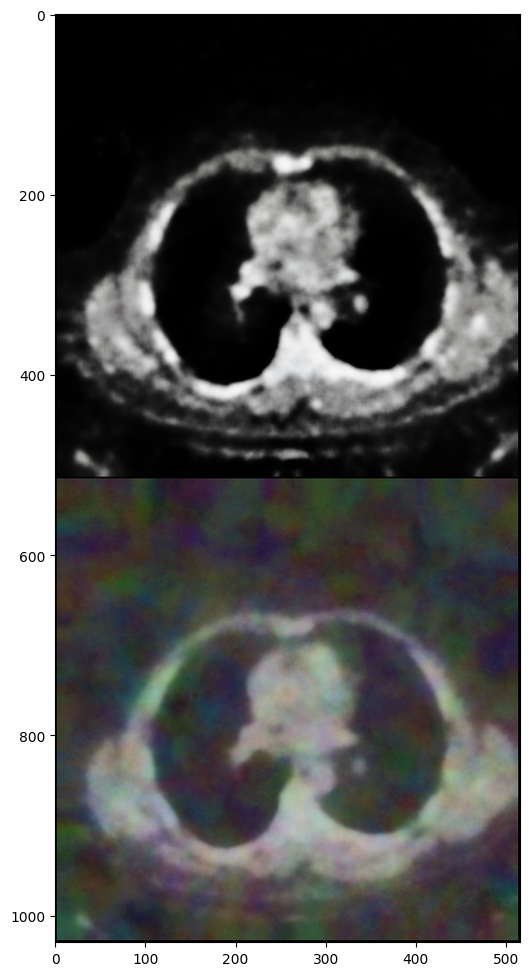

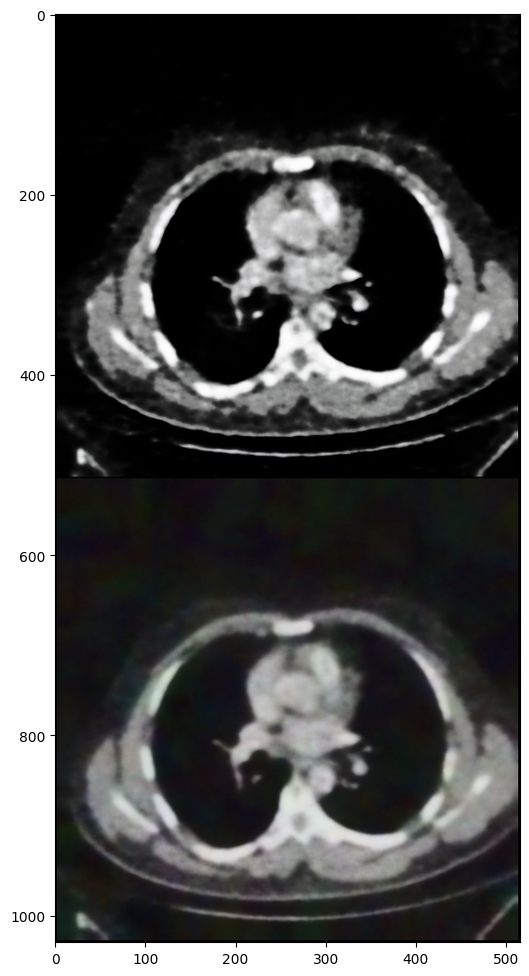

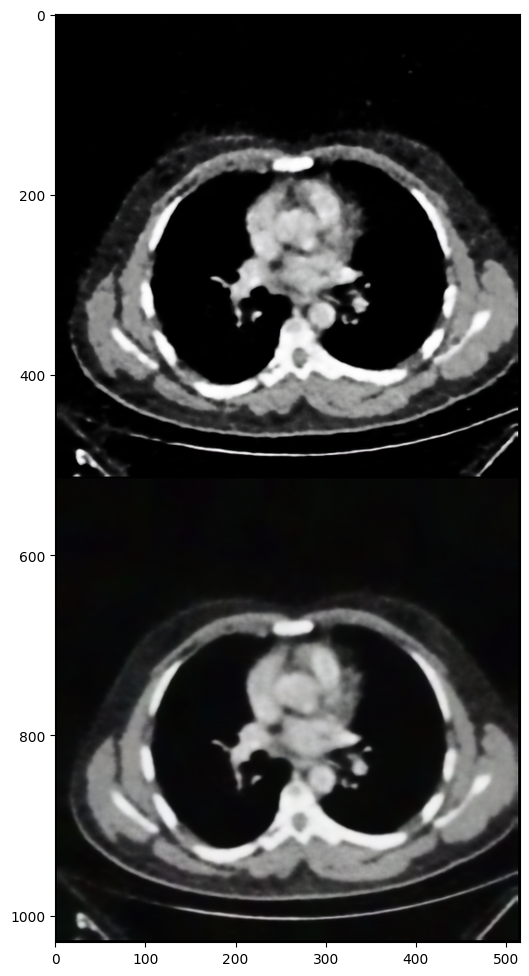

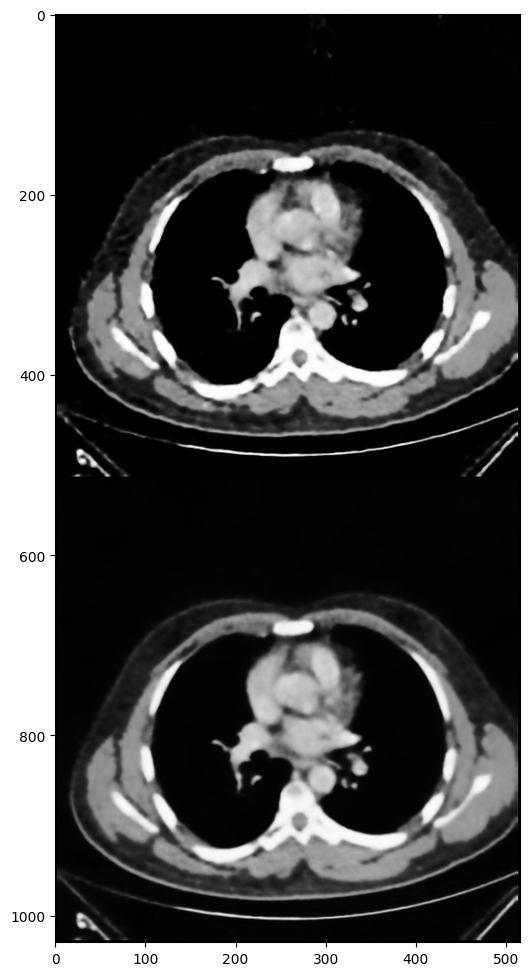

...

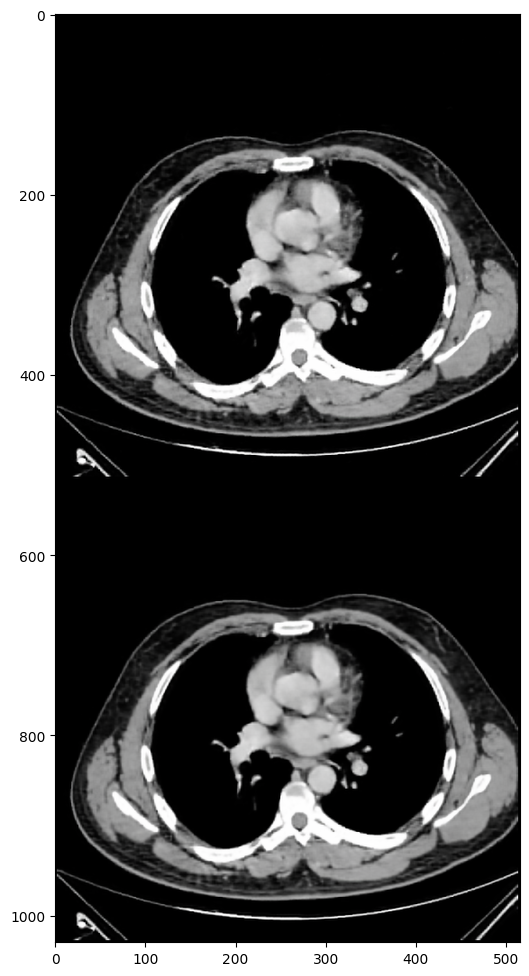

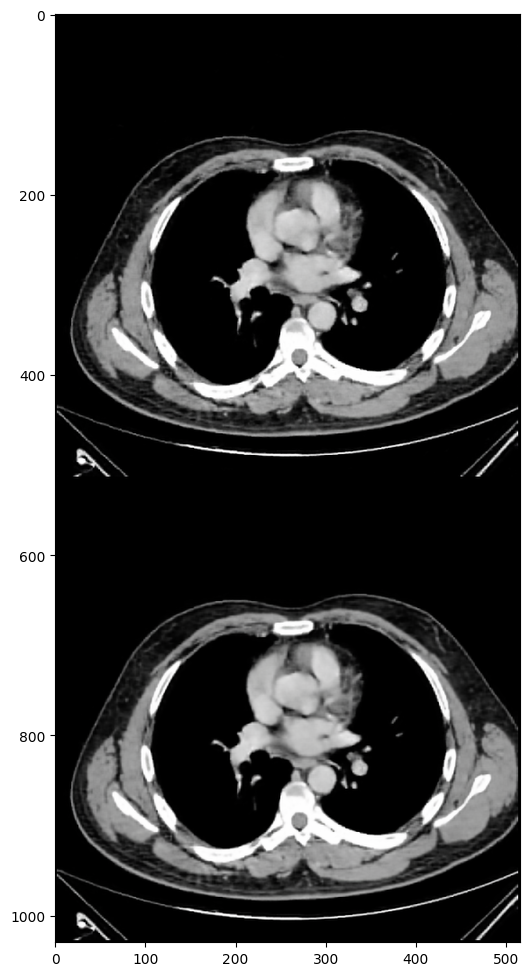

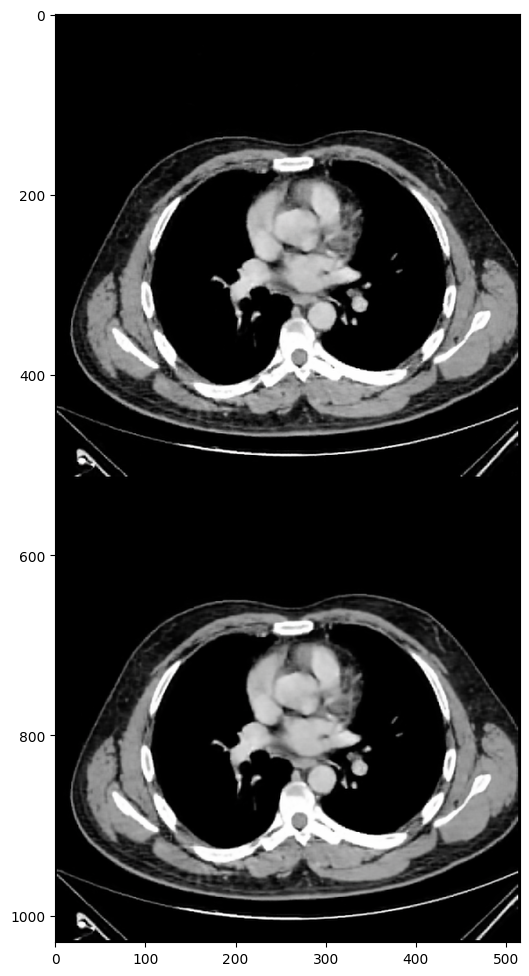

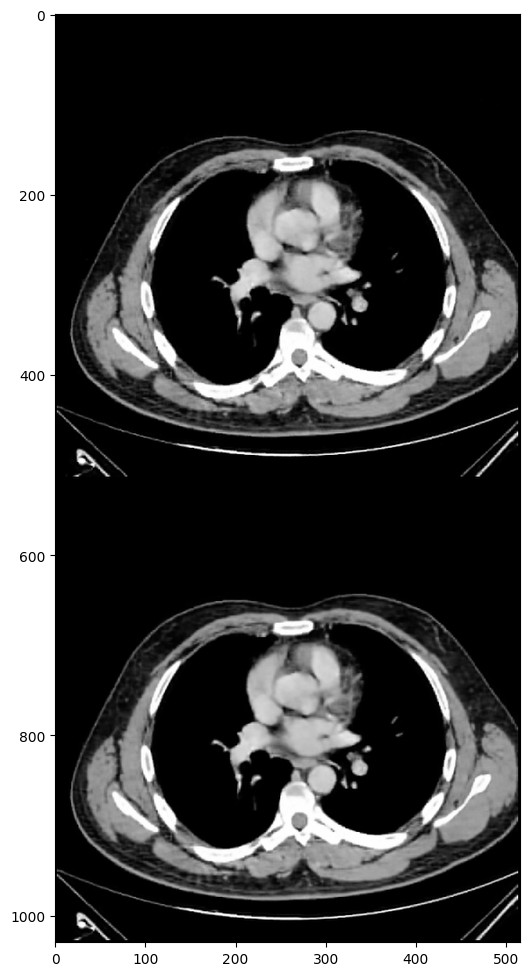

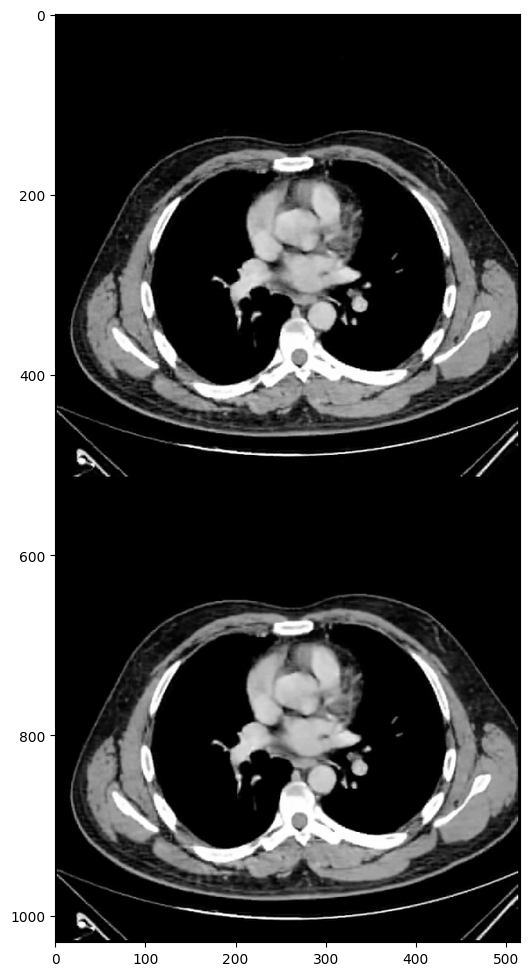

In [9]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0


i = 0
def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input


    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = net(net_input)

    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)

    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()

    psrn_noisy = compare_psnr(img_noisy_np, out.detach().cpu().numpy()[0])
    psrn_gt    = compare_psnr(img_np, out.detach().cpu().numpy()[0])
    psrn_gt_sm = compare_psnr(img_np, out_avg.detach().cpu().numpy()[0])

    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')

    if PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1),
                 np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)


    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5:
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy

    i += 1

    return total_loss




p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

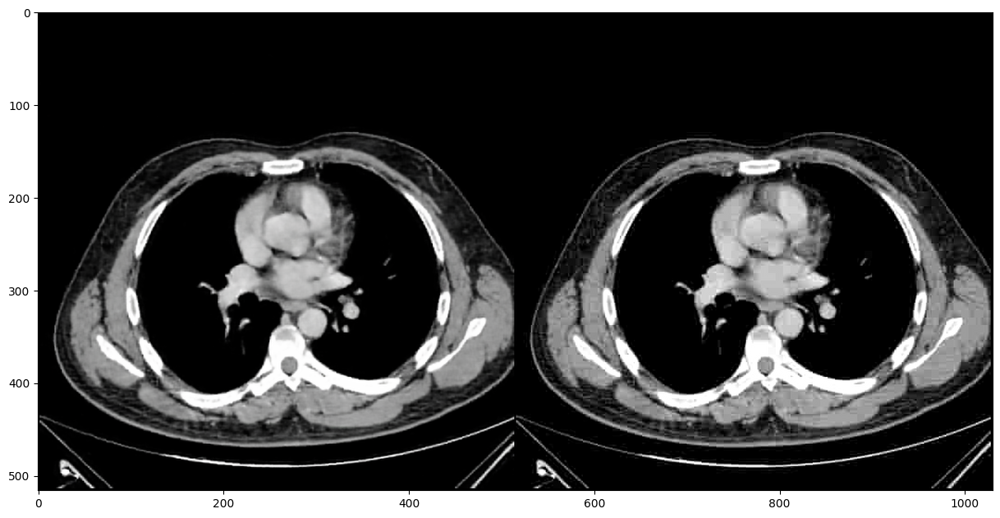

In [10]:
out_np = torch_to_np(net(net_input))

q = plot_image_grid([np.clip(out_np, 0, 1), img_np], factor=13);